# Object Detection

In this tutorial, you will learn:
- the basic structure of RTMDet.
- to perform inference with a MMDetection detector.
- to train a new detector with a new dataset.

Let's start!

```{note}
The commands in this tutorial are mainly for Colab.
You can click the button above, `Open in Colab`, to run this notebook in Colab.
```

## Install MMDetection

In [1]:
# Check nvcc version
!nvcc -V

# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Jun__8_16:49:14_PDT_2022
Cuda compilation tools, release 11.7, V11.7.99
Build cuda_11.7.r11.7/compiler.31442593_0


gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
# %pip install -U openmim
# !mim install "mmengine>=0.7.0"
# !mim install "mmcv>=2.0.0rc4"

# # Install mmdetection
# !rm -rf mmdetection
# !git clone https://github.com/open-mmlab/mmdetection.git
# %cd mmdetection

# %pip install -e .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 kB 536.0 kB/s eta 0:00:00
/usr/local/lib/python3.9/dist-packages/setuptools/command/install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 366.9/366.9 kB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.2/190.2 kB 25.6 MB/s eta 0:00:00
/usr/local/lib/python3.9/dist-packages/setuptools/command/install.py:34: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/setuptools/command/install.

In [1]:
from mmengine.utils import get_git_hash
from mmengine.utils.dl_utils import collect_env as collect_base_env

import mmdet


def collect_env():
    """Collect the information of the running environments."""
    env_info = collect_base_env()
    env_info['MMDetection'] = f'{mmdet.__version__}+{get_git_hash()[:7]}'
    return env_info


if __name__ == '__main__':
    for name, val in collect_env().items():
        print(f'{name}: {val}')

sys.platform: linux
Python: 3.8.10 (default, Jun  4 2021, 15:09:15) [GCC 7.5.0]
CUDA available: True
MUSA available: False
numpy_random_seed: 2147483648
GPU 0: NVIDIA GeForce RTX 3080
CUDA_HOME: /usr/local/cuda
NVCC: Cuda compilation tools, release 11.7, V11.7.99
GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
PyTorch: 2.0.0+cu117
PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.7
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gencode;arch=c

## Perform Inference with An MMDet detector



### An efficient Real-Time one-stage detector

In this tutorial, we use RTMDet, an efficient Real-Time one-stage detector as an example.

The high-level architecture of RTMDet is shown in the following picture. More details can be found in the [paper](https://arxiv.org/abs/2212.07784).

![RTMDet](https://user-images.githubusercontent.com/27466624/225922103-404064c1-3cb0-4ab5-9388-79f9517dcdb0.jpg)

To obtain a more efficient model architecture, MMDetection explore an architecture that has compatible capacities in the backbone and neck, constructed by a basic building block that consists of large-kernel depth-wise convolutions. MMDetection further introduce soft labels when calculating matching costs in the dynamic label assignment to improve accuracy. Together with better training techniques, the resulting object detector, named RTMDet, achieves 52.8% AP on COCO with 300+ FPS on an NVIDIA 3090 GPU, outperforming the current mainstream industrial detectors. RTMDet achieves the best parameter-accuracy trade-off with tiny/small/medium/large/extra-large model sizes for various application scenarios, and obtains new state-of-the-art performance on real-time instance segmentation and rotated object detection. We hope the experimental results can provide new insights into designing versatile real-time object detectors for many object recognition tasks.



In [2]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir ./checkpoints
!mim download mmdet --config rtmdet_tiny_8xb32-300e_coco --dest ./checkpoints

mkdir: cannot create directory ‘./checkpoints’: File exists


processing rtmdet_tiny_8xb32-300e_coco...
rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth exists in /hy-tmp/mmdetection/demo/checkpoints
Successfully dumped rtmdet_tiny_8xb32-300e_coco.py to /hy-tmp/mmdetection/demo/checkpoints


### Inference the detector

Since the model is successfully created and loaded, let's see how good it is. We use the high-level API `DetInferencer` implemented in the MMDetection. This API is created to ease the inference process. The details of the codes can be found [here](https://github.com/open-mmlab/mmdetection/blob/dev-3.x/mmdet/apis/det_inferencer.py).

In [3]:
from mmdet.apis import DetInferencer

# Choose to use a config
model_name = 'rtmdet_tiny_8xb32-300e_coco'
# Setup a checkpoint file to load
checkpoint = './checkpoints/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(model_name, checkpoint, device)

# Use the detector to do inference
img = './demo.jpg'
result = inferencer(img, out_dir='./output')

Loads checkpoint by local backend from path: ./checkpoints/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: data_preprocessor.mean, data_preprocessor.std



05/26 05:31:38 - mmengine - WARNING - Failed to search registry with scope "mmdet" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmdet" is a correct scope, or whether the registry is initialized.


/usr/local/miniconda3/lib/python3.8/site-packages/rich/live.py:231: UserWarning: install "ipywidgets" for Jupyter 
support
  warnings.warn('install "ipywidgets" for Jupyter support')

/usr/local/miniconda3/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:196: UserWarning: Failed to add <class 'mmengine.visualization.vis_backend.LocalVisBackend'>, please provide the `save_dir` argument.
  warnings.warn(f'Failed to add {vis_backend.__class__}, '


/usr/local/miniconda3/lib/python3.8/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an 
upcoming release, it will be required to pass the indexing argument. (Triggered internally at 
../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]

In [4]:
# Show the structure of result dict
from rich.pretty import pprint
pprint(result, max_length=4)

{
│   'predictions': [
│   │   {
│   │   │   'labels': [13, 2, 2, 2, ... +296],
│   │   │   'scores': [0.8701602220535278, 0.7678492069244385, 0.7430709600448608, 0.6995478272438049, ... +296],
│   │   │   'bboxes': [
│   │   │   │   [221.3673095703125, 176.1226348876953, 456.25323486328125, 383.24859619140625],
│   │   │   │   [295.34539794921875, 117.18141174316406, 378.5771484375, 150.26739501953125],
│   │   │   │   [190.5687255859375, 109.70532989501953, 299.5132751464844, 155.0348663330078],
│   │   │   │   [431.36859130859375, 104.98223114013672, 484.8769226074219, 131.941162109375],
│   │   │   │   ... +296
│   │   │   ]
│   │   }
│   ],
│   'visualization': [
│   │   array([[[ 28,  48,  13],
│   │   [ 37,  63,  28],
│   │   [ 30,  64,  27],
│   │   ...,
│   │   [ 23,  47,  31],
│   │   [ 31,  67,  31],
│   │   [ 54,  92,  17]],
│      
│      [[ 23,  42,   0],
│   │   [ 25,  50,   8],
│   │   [ 30,  62,  21],
│   │   ...,
│   │   [ 92, 114, 102],
│   │   [ 16,  53,  12],
│   │   [ 44,  75,  16]],
│      
│      [[ 20,  50,   0],
│   │   [ 25,  59,   8],
│   │   [ 29,  66,  23],
│   │   ...,
│   │   [ 47,  70,  44],
│   │   [ 29,  60,  18],
│   │   [ 54,  77,  31]],
│      
│      ...,
│      
│      [[ 63,  68,  45],
│   │   [ 58,  66,  27],
│   │   [ 74,  84,  49],
│   │   ...,
│   │   [ 32,  46,  23],
│   │   [ 56,  76,  39],
│   │   [ 31,  47,  18]],
│      
│      [[ 60,  66,  40],
│   │   [ 45,  55,  18],
│   │   [ 83,  92,  61],
│   │   ...,
│   │   [ 63,  77,  54],
│   │   [ 47,  67,  30],
│   │   [ 35,  52,  20]],
│      
│      [[ 64,  70,  42],
│   │   [ 85,  95,  60],
│   │   [ 66,  75,  48],
│   │   ...,
│   │   [ 37,  51,  28],
│   │   [ 59,  79,  42],
│   │   [ 44,  61,  29]]], dtype=uint8)
│   ]
}

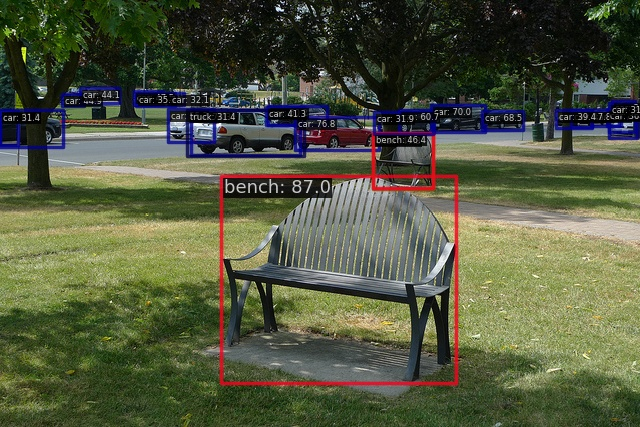

In [5]:
# Show the output image
from PIL import Image
Image.open('./output/vis/demo.jpg')

## Train with customized datasets

In this part, you will know how to train predefined models with customized datasets and then test it. We use the [balloon dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon) as an example to describe the whole process.

The basic steps are as below:

1. Prepare the customized dataset
2. Prepare a config
3. Train, test, and infer models on the customized dataset.


### Prepare the customized dataset

There are three ways to support a new dataset in MMDetection:

1. Reorganize the dataset into COCO format.
2. Reorganize the dataset into a middle format.
3. Implement a new dataset.

Usually, we recommend using the first two methods which are usually easier than the third.

In this tutorial, we use the ballon dataset an example of converting the data into COCO format.

**Note**: Datasets and metrics have been decoupled except CityScapes since MMDetection 3.0. Therefore, users can use any kind of evaluation metrics for any format of datasets during validation. For example: evaluate on COCO dataset with VOC metric, or evaluate on OpenImages dataset with both VOC and COCO metrics.

In [8]:
# Download the data and unzip it
!python ../tools/misc/download_dataset.py --dataset-name balloon --save-dir data --unzip

100%|██████████████████████████████████████| 36.9M/36.9M [00:01<00:00, 26.1MB/s]
Unzipping balloon_dataset.zip


#### COCO annotation format
The necessary keys of COCO format for instance segmentation are as below, for the complete details, please refer [here](https://cocodataset.org/#format-data).

```json
{
    "images": [image],
    "annotations": [annotation],
    "categories": [category]
}
image = {
    "id": int,
    "width": int,
    "height": int,
    "file_name": str,
}
annotation = {
    "id": int,
    "image_id": int,
    "category_id": int,
    "segmentation": RLE or [polygon],
    "area": float,
    "bbox": [x,y,width,height], # (x, y) are the coordinates of the upper left corner of the bbox
    "iscrowd": 0 or 1,
}
categories = [{
    "id": int,
    "name": str,
    "supercategory": str,
}]
```

Assume we use the balloon dataset.
After downloading the data, we need to implement a function to convert the annotation format into the COCO format. Then we can use implemented `CocoDataset` to load the data and perform training and evaluation.

If you take a look at the dataset, you will find the dataset format is as below:

```json
{'base64_img_data': '',
 'file_attributes': {},
 'filename': '34020010494_e5cb88e1c4_k.jpg',
 'fileref': '',
 'regions': {'0': {'region_attributes': {},
   'shape_attributes': {'all_points_x': [1020,
     1000,
     994,
     1003,
     1023,
     1050,
     1089,
     1134,
     1190,
     1265,
     1321,
     1361,
     1403,
     1428,
     1442,
     1445,
     1441,
     1427,
     1400,
     1361,
     1316,
     1269,
     1228,
     1198,
     1207,
     1210,
     1190,
     1177,
     1172,
     1174,
     1170,
     1153,
     1127,
     1104,
     1061,
     1032,
     1020],
    'all_points_y': [963,
     899,
     841,
     787,
     738,
     700,
     663,
     638,
     621,
     619,
     643,
     672,
     720,
     765,
     800,
     860,
     896,
     942,
     990,
     1035,
     1079,
     1112,
     1129,
     1134,
     1144,
     1153,
     1166,
     1166,
     1150,
     1136,
     1129,
     1122,
     1112,
     1084,
     1037,
     989,
     963],
    'name': 'polygon'}}},
 'size': 1115004}
```

The annotation is a JSON file where each key indicates an image's all annotations.
The code to convert the balloon dataset into coco format is as below.

Using the function below, users can successfully convert the annotation file into json format, then we can use `CocoDataset` to train and evaluate the model with `CocoMetric`.

In [7]:
import os.path as osp
import mmcv
from mmengine.fileio import dump, load
from mmengine.utils import track_iter_progress

def convert_balloon_to_coco(ann_file, out_file, image_prefix):
    data_infos = load(ann_file)

    annotations = []
    images = []
    obj_count = 0
    for idx, v in enumerate(track_iter_progress(list(data_infos.values()))):
        filename = v['filename']
        img_path = osp.join(image_prefix, filename)
        height, width = mmcv.imread(img_path).shape[:2]

        images.append(
            dict(id=idx, file_name=filename, height=height, width=width))
        
        for _, obj in v['regions'].items():
            assert not obj['region_attributes']
            obj = obj['shape_attributes']
            px = obj['all_points_x']
            py = obj['all_points_y']
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            x_min, y_min, x_max, y_max = (min(px), min(py), max(px), max(py))

            data_anno = dict(
                image_id=idx,
                id=obj_count,
                category_id=0,
                bbox=[x_min, y_min, x_max - x_min, y_max - y_min],
                area=(x_max - x_min) * (y_max - y_min),
                segmentation=[poly],
                iscrowd=0)
            annotations.append(data_anno)
            obj_count += 1

    coco_format_json = dict(
        images=images,
        annotations=annotations,
        categories=[{
            'id': 0,
            'name': 'balloon'
        }])
    dump(coco_format_json, out_file)

if __name__ == '__main__':
    convert_balloon_to_coco(ann_file='data/balloon/train/via_region_data.json',
                            out_file='data/balloon/train.json',
                            image_prefix='data/balloon/train')
    convert_balloon_to_coco(ann_file='data/balloon/val/via_region_data.json',
                            out_file='data/balloon/val.json',
                            image_prefix='data/balloon/val')

[                                 ] 1/61, 12.4 task/s, elapsed: 0s, ETA:     5s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 61/61, 33.0 task/s, elapsed: 2s, ETA:     0s
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 13/13, 32.7 task/s, elapsed: 0s, ETA:     0s


## Prepare a config

The second step is to prepare a config thus the dataset could be successfully loaded. Assume that we want to use RTMDet-tiny, the config to train the detector on balloon dataset is as below. Assume the config is under directory `configs/rtmdet/` and named as `rtmdet_tiny_1xb4-20e_balloon.py`, the config is as below.


In [15]:
config_balloon = """
# Inherit and overwrite part of the config based on this config
_base_ = './rtmdet_tiny_8xb32-300e_coco.py'

data_root = 'data/balloon/' # dataset root

train_batch_size_per_gpu = 4
train_num_workers = 2

max_epochs = 20
stage2_num_epochs = 1
base_lr = 0.00008


metainfo = {
    'classes': ('balloon', ),
    'palette': [
        (220, 20, 60),
    ]
}

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='train/'),
        ann_file='train.json'))

val_dataloader = dict(
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='val/'),
        ann_file='val.json'))

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'val.json')

test_evaluator = val_evaluator

model = dict(bbox_head=dict(num_classes=1))

# learning rate
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=10),
    dict(
        # use cosine lr from 10 to 20 epoch
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]

train_pipeline_stage2 = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='RandomResize',
        scale=(640, 640),
        ratio_range=(0.1, 2.0),
        keep_ratio=True),
    dict(type='RandomCrop', crop_size=(640, 640)),
    dict(type='YOLOXHSVRandomAug'),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

# optimizer
optim_wrapper = dict(
    _delete_=True,
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.05),
    paramwise_cfg=dict(
        norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

default_hooks = dict(
    checkpoint=dict(
        interval=5,
        max_keep_ckpts=2,  # only keep latest 2 checkpoints
        save_best='auto'
    ),
    logger=dict(type='LoggerHook', interval=5))

custom_hooks = [
    dict(
        type='PipelineSwitchHook',
        switch_epoch=max_epochs - stage2_num_epochs,
        switch_pipeline=train_pipeline_stage2)
]

# load COCO pre-trained weight
load_from = './checkpoints/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=1)
visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""

with open('../configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py', 'w') as f:
    f.write(config_balloon)

In [16]:
!python ../tools/train.py ../configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py

05/25 05:32:08 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.10 (default, Jun  4 2021, 15:09:15) [GCC 7.5.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 945261109
    GPU 0: NVIDIA GeForce RTX 3080 Ti
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
    PyTorch: 2.0.0+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm

### Understand the log
From the log, we can have a basic understanding on the training process and know how well the detector is trained.

First, since the dataset we are using is small, we loaded a pre-trained Faster R-CNN model and fine-tune it for detection. 
The original Faster R-CNN is trained on COCO dataset that contains 80 classes but KITTI Tiny dataset only have 3 classes. Therefore, the last FC layers of the pre-trained Faster R-CNN for classification and regression have different weight shape and are not used.

Second, after training, the detector is evaluated by the default VOC-style evaluation. The results show that the detector achieves 58.1 mAP on the val dataset, not bad!

We can also check the tensorboard to see the curves.

In [17]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir ./work_dirs

Launching TensorBoard...

From the tensorboard, we can observe that changes of loss and learning rate. We can see the losses of each branch gradually decrease as the training goes by.

## Test the Trained Detector

After finetuning the detector, let's visualize the prediction results!

In [7]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = '../work_dirs/faster-rcnn_r50_fpn_1x_voc07/faster-rcnn_r50_fpn_1x_voc07.py'
# Setup a checkpoint file to load
checkpoint = glob.glob('../work_dirs/faster-rcnn_r50_fpn_1x_voc07/best*.pth')[0]

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Use the detector to do inference
external_imgs = glob.glob('/hy-tmp/mmdetection/external_images/*.jpg')
result = inferencer(external_imgs, out_dir='./output_external_faster_rcnn', pred_score_thr=0.5)

test_imgs = ['/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/001344.jpg',
            '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/003104.jpg',
            '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/004161.jpg',
            '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/006980.jpg',
            '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/008548.jpg',     
            '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/009876.jpg']
result = inferencer(test_imgs, out_dir='./output_test_faster_rcnn', pred_score_thr=0.5)

Loads checkpoint by local backend from path: ../work_dirs/faster-rcnn_r50_fpn_1x_voc07/best_pascal_voc_mAP_epoch_5.pth


In [1]:
import shutil
import os

# 源文件路径列表
test_imgs = [
    '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/001344.jpg',
    '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/003104.jpg',
    '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/004161.jpg',
    '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/006980.jpg',
    '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/008548.jpg',
    '/hy-tmp/datasets/VOCdevkit/VOC2007/JPEGImages/009876.jpg'
]

# 目标文件夹路径
destination_folder = '../test_raw'

# 确保目标文件夹存在
os.makedirs(destination_folder, exist_ok=True)

# 复制文件
for img_path in test_imgs:
    # 获取文件名
    file_name = os.path.basename(img_path)
    # 构造目标文件路径
    destination_path = os.path.join(destination_folder, file_name)
    # 复制文件
    shutil.copy(img_path, destination_path)

print("文件已成功复制到目标文件夹。")


文件已成功复制到目标文件夹。


In [3]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = '../configs/yolo/yolov3_d53_8xb8-ms-608-273e_voc07_v2.py'
# Setup a checkpoint file to load
checkpoint = glob.glob('../work_dirs/yolov3_d53_8xb8-ms-608-273e_voc07_v2/epoch_77.pth')[-1]
# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Use the detector to do inference
external_imgs = glob.glob('/hy-tmp/mmdetection/external_images/*.jpg')
result = inferencer(external_imgs, out_dir='./output_external_yolov3', pred_score_thr=0.3)


result = inferencer(test_imgs, out_dir='./output_test_yolov3', pred_score_thr=0.3)

Loads checkpoint by local backend from path: ../work_dirs/yolov3_d53_8xb8-ms-608-273e_voc07_v2/epoch_77.pth


RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


绘制gd图片

In [3]:
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import json
import glob
import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
# 加载 COCO 格式的标注文件
with open('/hy-tmp/mmdetection/external_images/instances_val2017.json') as f:
    instances = json.load(f)
instances_df = pd.DataFrame(instances['annotations'])
# 获取选定图片的文件名列表
external_imgs = glob.glob('/hy-tmp/mmdetection/external_images/*.jpg')
external_imgs = [os.path.basename(img) for img in external_imgs]

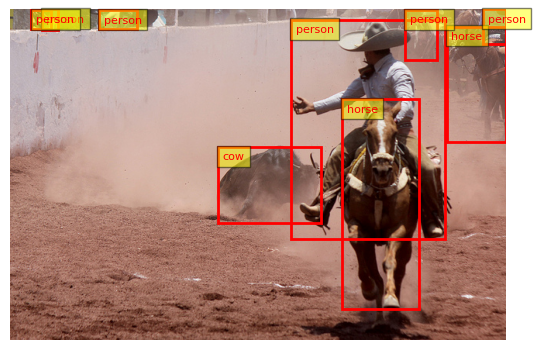

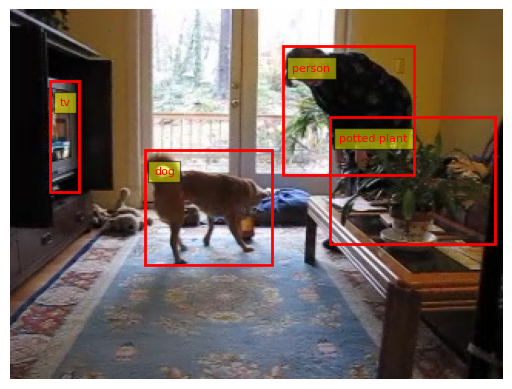

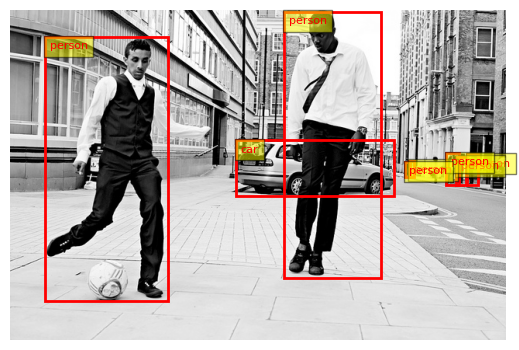

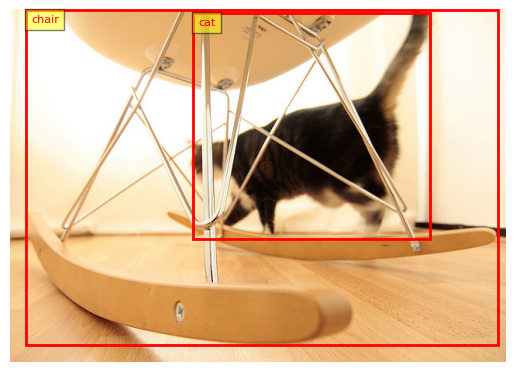

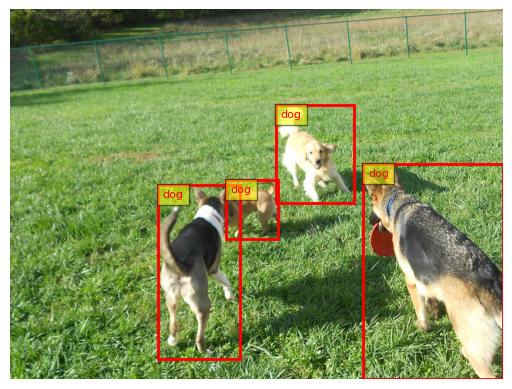

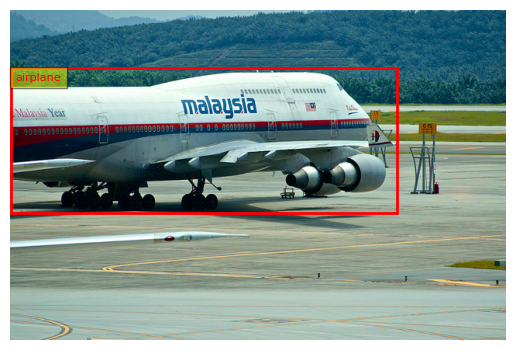

In [4]:
import matplotlib.patches as patches
from PIL import Image

# 创建一个字典，用于快速查找文件名对应的图片ID
image_id_map = {img['file_name']: img['id'] for img in instances['images']}
cate_map = {cat['id']: cat['name'] for cat in instances['categories']}
for img_file in external_imgs:
    image_id = image_id_map.get(img_file)
    anno = instances_df[instances_df['image_id'] == image_id]
    img = Image.open(f'/hy-tmp/mmdetection/external_images/{img_file}')
    # plt.imshow(img)  # 显示图片
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    for idx,  row in anno.iterrows():
        if cate_map[row['category_id']] in ['teddy bear', 'tie', 'sports ball', 'frisbee']:
            continue
        xmin, ymin, width, height = row['bbox']
        # 创建一个矩形补丁
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor='none')
        # 添加矩形补丁到图像中
        ax.add_patch(rect)
        # 添加类别标签
        plt.text(xmin + 6, ymin + 16, cate_map[row['category_id']], color='r', fontsize=8, bbox=dict(facecolor='yellow', alpha=0.5))
    # plt.show()
    # 移除坐标轴
    ax.set_axis_off()

    # 保存图像
    output_path = f'external_gd/vis/{img_file}'
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0, transparent=True)
    plt.show()
    plt.close()

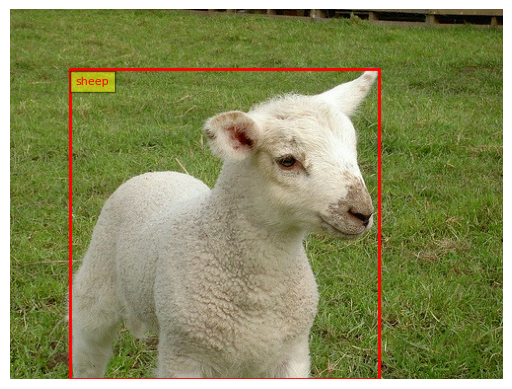

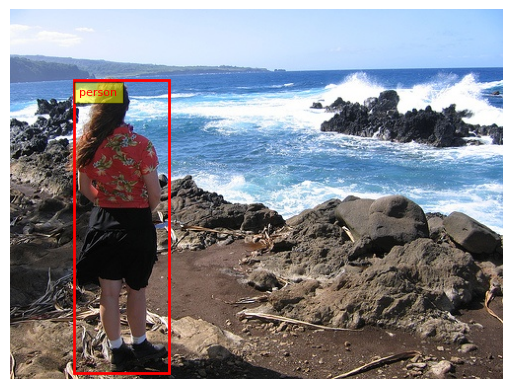

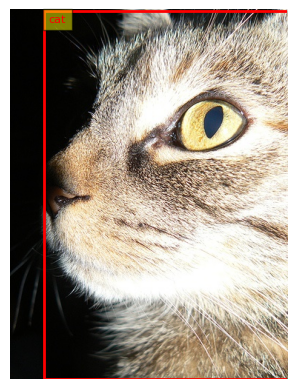

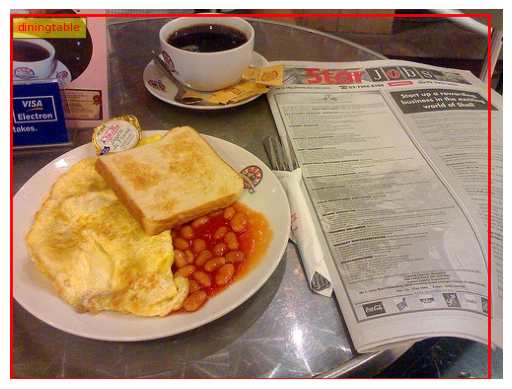

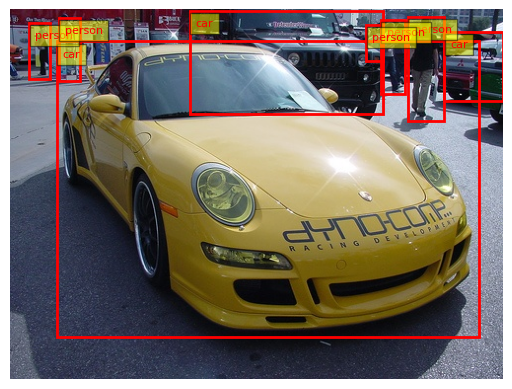

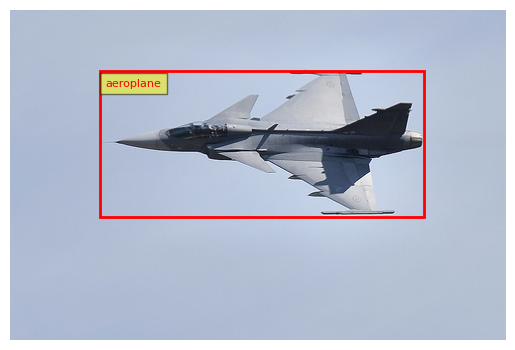

In [13]:
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    boxes = []
    labels = []

    for obj in root.findall('object'):
        label = obj.find('name').text
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        boxes.append((xmin, ymin, xmax, ymax))
        labels.append(label)

    return boxes, labels

import matplotlib.patches as patches
from PIL import Image


for img_file in test_imgs:
    boxes, labels = parse_annotation(img_file.replace('JPEGImages', 'Annotations').replace('.jpg', '.xml'))
    # anno = instances_df[instances_df['image_id'] == image_id]
    img = Image.open(img_file)
    # plt.imshow(img)  # 显示图片
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    for box, label in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin
        # 创建一个矩形补丁
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor='none')
        # 添加矩形补丁到图像中
        ax.add_patch(rect)
        # 添加类别标签
        plt.text(xmin + 6, ymin + 16, label, color='r', fontsize=8, bbox=dict(facecolor='yellow', alpha=0.5))
    
    # 移除坐标轴
    ax.set_axis_off()

    # 保存图像
    output_path = f'test_gd/vis/{os.path.basename(img_file)}'
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0, transparent=True)
    plt.show()
    plt.close()

In [13]:
external_imgs

['000000500049.jpg',
 '000000540928.jpg',
 '000000547502.jpg',
 '000000566282.jpg',
 '000000404484.jpg',
 '000000377486.jpg']

In [15]:
image_id_map

{'000000397133.jpg': 397133,
 '000000037777.jpg': 37777,
 '000000252219.jpg': 252219,
 '000000087038.jpg': 87038,
 '000000174482.jpg': 174482,
 '000000403385.jpg': 403385,
 '000000006818.jpg': 6818,
 '000000480985.jpg': 480985,
 '000000458054.jpg': 458054,
 '000000331352.jpg': 331352,
 '000000296649.jpg': 296649,
 '000000386912.jpg': 386912,
 '000000502136.jpg': 502136,
 '000000491497.jpg': 491497,
 '000000184791.jpg': 184791,
 '000000348881.jpg': 348881,
 '000000289393.jpg': 289393,
 '000000522713.jpg': 522713,
 '000000181666.jpg': 181666,
 '000000017627.jpg': 17627,
 '000000143931.jpg': 143931,
 '000000303818.jpg': 303818,
 '000000463730.jpg': 463730,
 '000000460347.jpg': 460347,
 '000000322864.jpg': 322864,
 '000000226111.jpg': 226111,
 '000000153299.jpg': 153299,
 '000000308394.jpg': 308394,
 '000000456496.jpg': 456496,
 '000000058636.jpg': 58636,
 '000000041888.jpg': 41888,
 '000000184321.jpg': 184321,
 '000000565778.jpg': 565778,
 '000000297343.jpg': 297343,
 '000000336587.jpg': 

In [23]:
# Show the structure of result dict
from rich.pretty import pprint
pprint(result, max_length=4)

{
│   'predictions': [
│   │   {
│   │   │   'labels': [6, 0],
│   │   │   'scores': [0.9886438846588135, 0.08481421321630478],
│   │   │   'bboxes': [
│   │   │   │   [216.33505249023438, 131.84976196289062, 347.0375671386719, 213.503662109375],
│   │   │   │   [213.89373779296875, 130.85289001464844, 351.06121826171875, 225.8787841796875]
│   │   │   ]
│   │   }
│   ],
│   'visualization': [
│   │   array([[[  4,   5,   9],
│   │   [  8,   9,  13],
│   │   [  7,   8,  12],
│   │   ...,
│   │   [  0,   3,  12],
│   │   [ 14,  14,  24],
│   │   [ 18,  18,  28]],
│      
│      [[ 12,  13,  18],
│   │   [ 10,  11,  16],
│   │   [  5,   6,  11],
│   │   ...,
│   │   [  6,   8,  20],
│   │   [  0,   2,  14],
│   │   [  8,   8,  18]],
│      
│      [[  3,   3,  11],
│   │   [  5,   5,  13],
│   │   [  5,   5,  13],
│   │   ...,
│   │   [  7,   9,  22],
│   │   [ 12,  11,  29],
│   │   [ 11,  10,  28]],
│      
│      ...,
│      
│      [[109,  87,  76],
│   │   [113,  91,  78],
│   │   [112,  89,  75],
│   │   ...,
│   │   [ 29,  14,   7],
│   │   [ 35,  22,  14],
│   │   [ 26,  13,   5]],
│      
│      [[111,  89,  76],
│   │   [104,  82,  68],
│   │   [112,  89,  73],
│   │   ...,
│   │   [ 31,  17,   8],
│   │   [ 36,  23,  15],
│   │   [ 26,  15,   9]],
│      
│      [[107,  86,  67],
│   │   [102,  81,  62],
│   │   [108,  87,  68],
│   │   ...,
│   │   [ 34,  19,  12],
│   │   [ 25,  11,  10],
│   │   [ 24,  10,  10]]], dtype=uint8)
│   ]
}

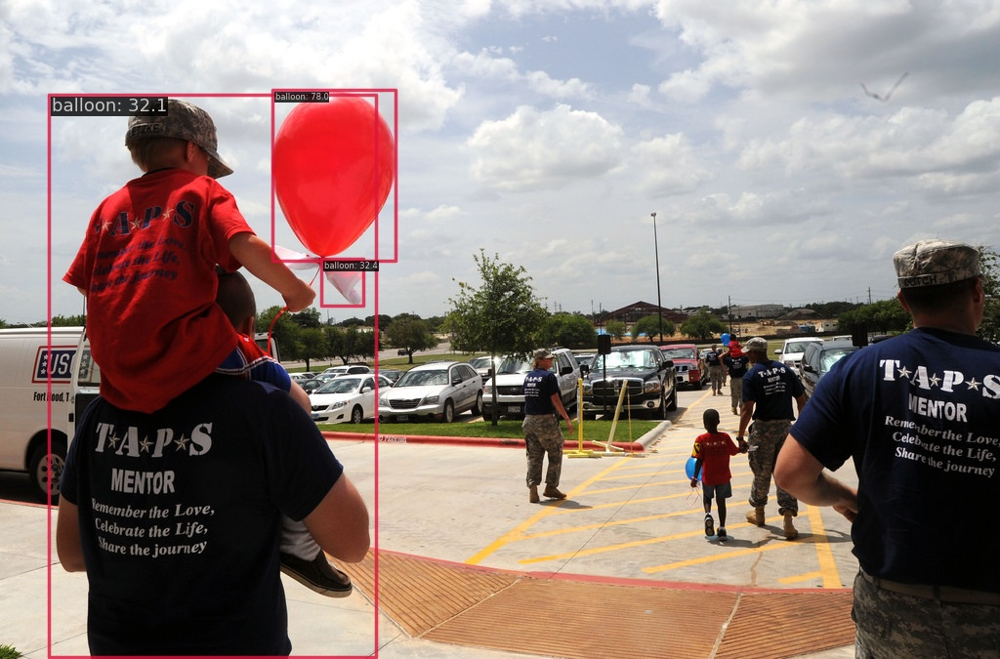

In [22]:
# Show the output image
Image.open('./output/vis/4838031651_3e7b5ea5c7_b.jpg')

## What to Do Next?

So far, we have learnt how to test and train a one-stage detector using MMDetection. To further explore MMDetection, you could do several other things as shown below:

- Try YOLO series object detection using [MMYOLO](https://github.com/open-mmlab/mmyolo), also one of the OpenMMLab projects. In MMYOLO, not only can you try all the methods supported in MMDetection but also some YOLO series detectors.
- Try rotated object detection using [MMRotate](https://github.com/open-mmlab/mmrotate), also one of the OpenMMLab projects. In MMRotate, not only can you try all the methods supported in MMDetection but also some rotated object detectors.
- Try 3D object detection using [MMDetection3D](https://github.com/open-mmlab/mmdetection3d), also one of the OpenMMLab projects. In MMDetection3D, not only can you try all the methods supported in MMDetection but also some 3D object detectors.
